# import

In [1]:
import os, sys
import random

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import matplotlib.pyplot as plt
%matplotlib inline

# 乱数シード初期化(必要であれば)

In [2]:
os.environ['PYTHONHASHSEED'] = '0'
random.seed(1)
np.random.seed(2)
tf.random.set_seed(3)

# 補助関数準備(描画用関数)

In [3]:
# 描画用関数
def draw_generator_image(generator):
    column = 3
    row = 2
    
    # 描画領域設定
    plt.figure(figsize=(16, 9))

    # 描画
    for i in range(column * row):
        batches = next(generator)  # (NumBatches, Height, Width, Channels)
        image = batches[0].astype(np.uint8)
        image = np.squeeze(image)  # 不要な次元の削減

        plt.subplot(row, column, i+1)
        plt.imshow(image)
    plt.show()

# 画像読み込み設定

In [4]:
image01_directory = os.path.join(os.getcwd(), 'image01')
image02_directory = os.path.join(os.getcwd(), 'image02')
image03_directory = os.path.join(os.getcwd(), 'image03')
image_size = (426, 640)
batch_size = 1

In [5]:
image_generator = ImageDataGenerator(data_format = "channels_last")
generator = image_generator.flow_from_directory(batch_size=1, directory=image01_directory, target_size=image_size)

fit_dataset = None
for i in range(3):
    batches = next(generator)  # (NumBatches, Height, Width, Channels)
    image = batches[0].astype(np.uint8)
    image = np.squeeze(image)  # 不要な次元の削減

    if i == 0:
        fit_dataset = image
    else:
        fit_dataset = np.vstack((fit_dataset, image))
    
fit_dataset = fit_dataset.reshape((3, 426, 640, 3))

Found 3 images belonging to 1 classes.


# ImageDataGeneratorデータ拡張サンプル

Found 3 images belonging to 1 classes.


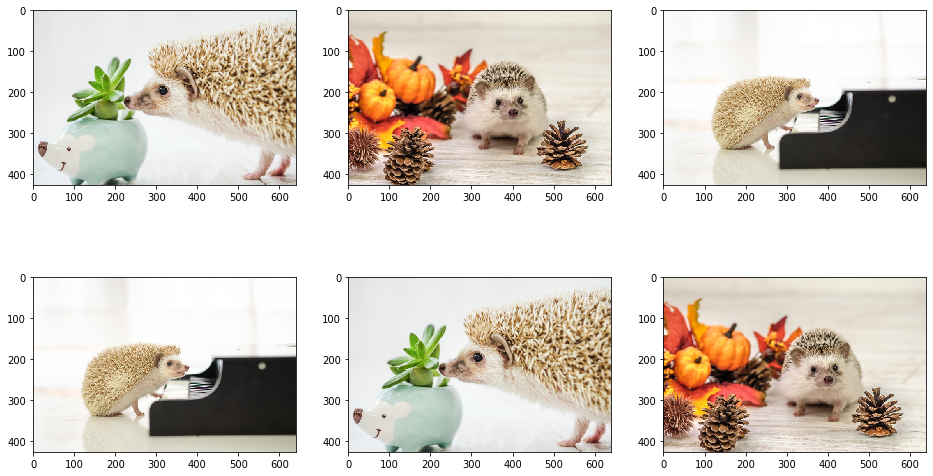

In [6]:
# データ拡張無し
image_generator = ImageDataGenerator()
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


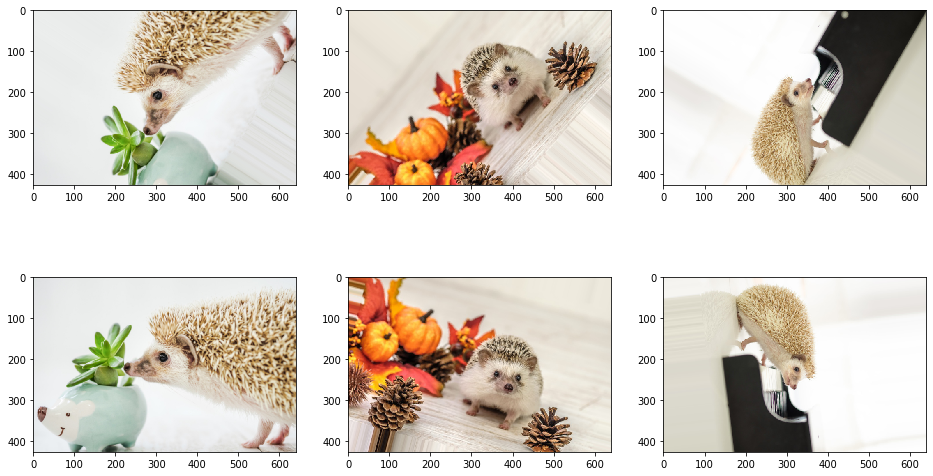

In [7]:
# ランダム回転
image_generator = ImageDataGenerator(rotation_range=90)  # -90～90度で回転
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


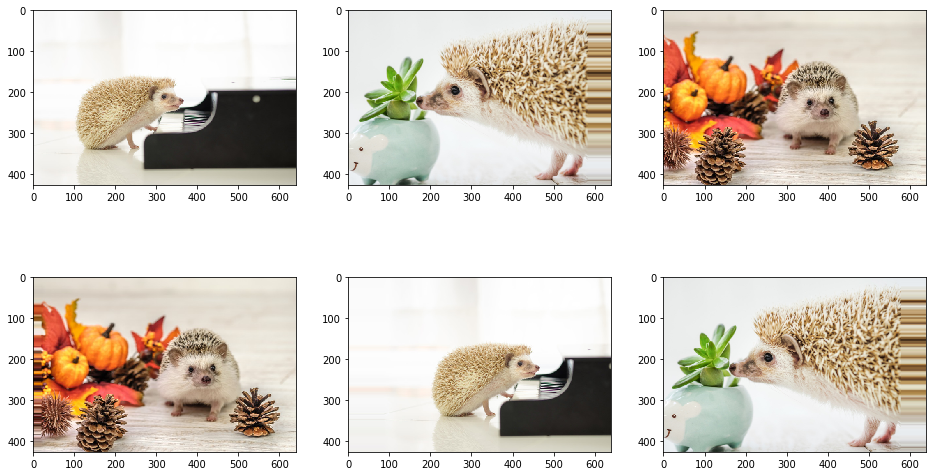

In [8]:
# ランダム水平シフト
image_generator = ImageDataGenerator(width_shift_range=100.0)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


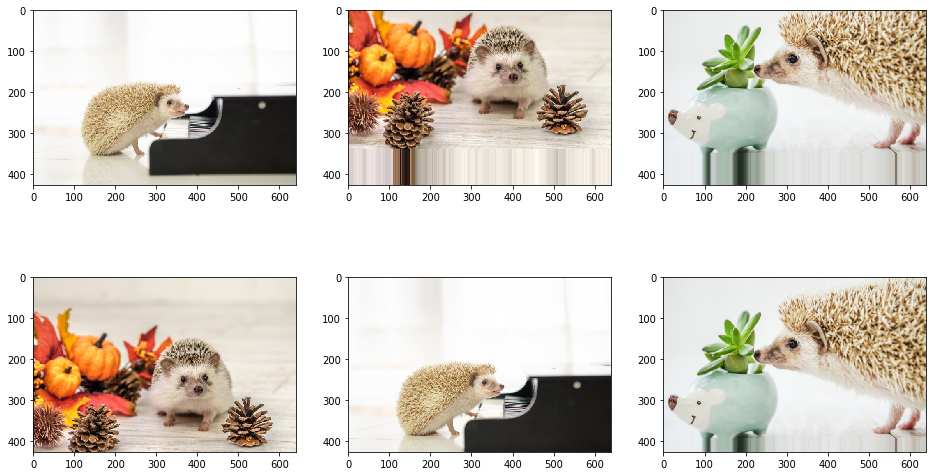

In [9]:
# ランダム垂直シフト
image_generator = ImageDataGenerator(height_shift_range=100.0)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


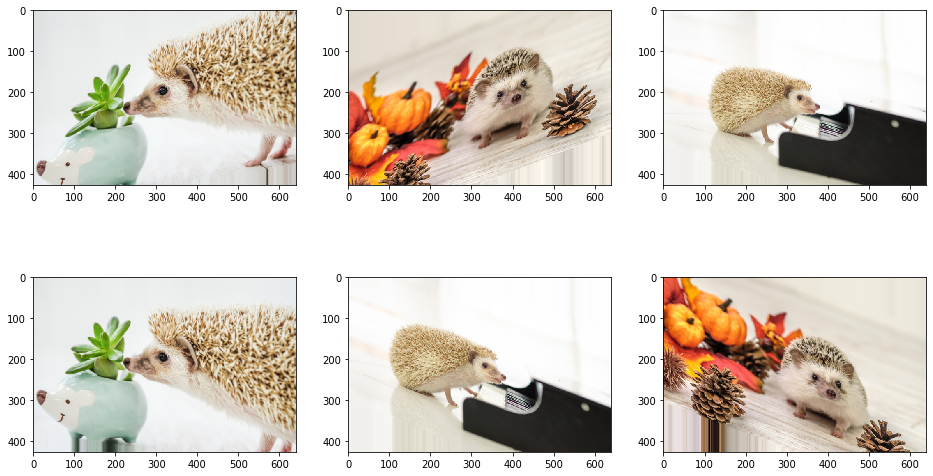

In [10]:
# ランダムシアー(せん断)
image_generator = ImageDataGenerator(shear_range=30.0)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


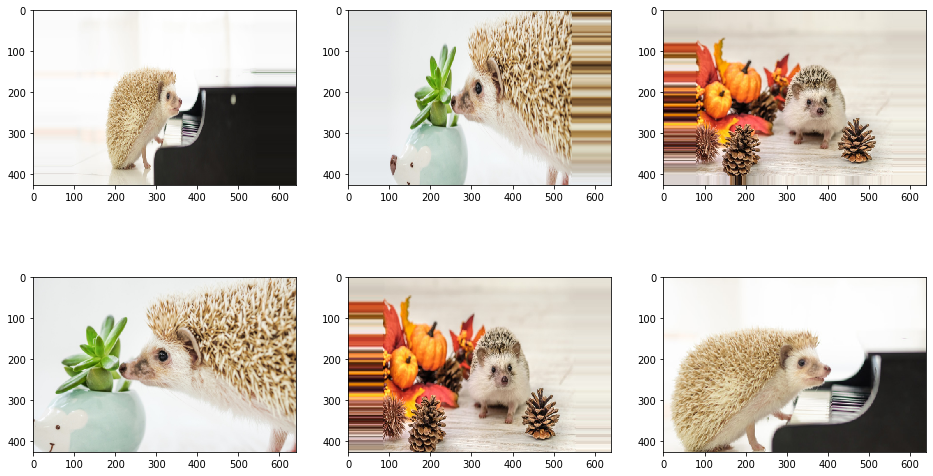

In [11]:
# ランダムズーム
image_generator = ImageDataGenerator(zoom_range=[0.5, 1.5])
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


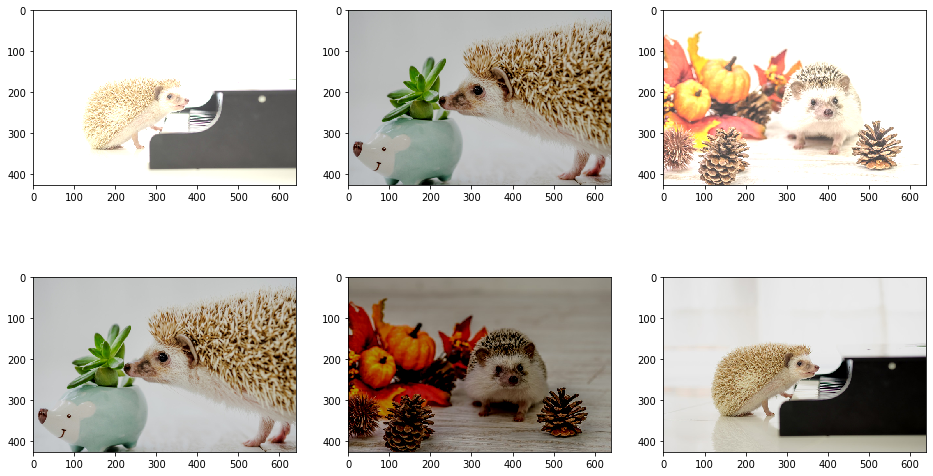

In [12]:
# ランダムチャンネルシフト
image_generator = ImageDataGenerator(channel_shift_range=90.0)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


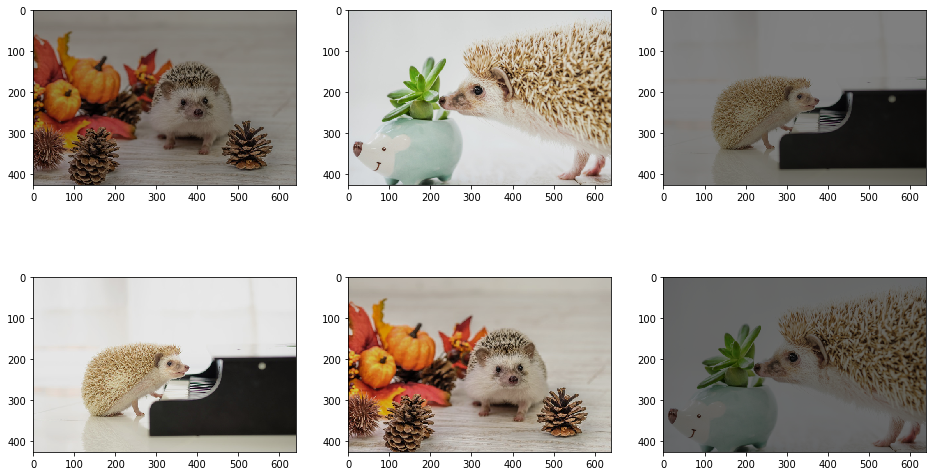

In [13]:
# ランダム輝度変更
image_generator = ImageDataGenerator(brightness_range=[0.3, 1.0])
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


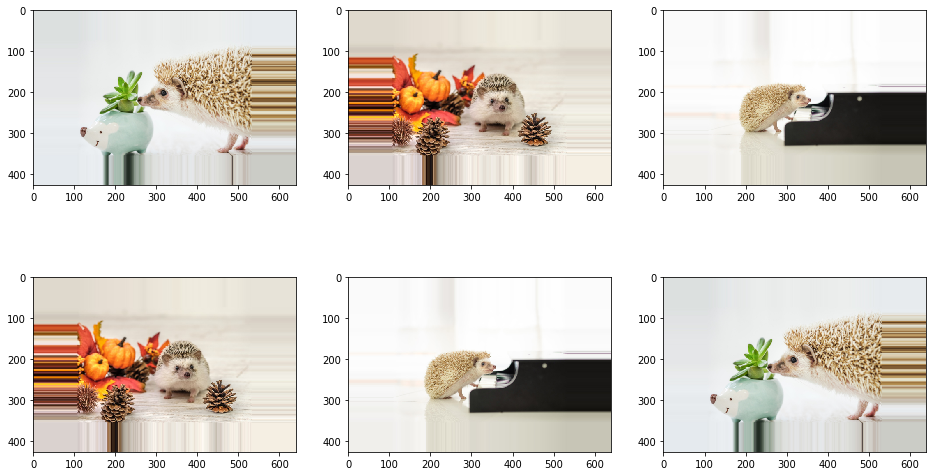

In [14]:
# フィルモード(デフォルトは'nearest')
# "nearest": aaaaaaaa|abcd|dddddddd
# "reflect": abcddcba|abcd|dcbaabcd
# "wrap": abcdabcd|abcd|abcdabcd
# "constant": kkkkkkkk|abcd|kkkkkkkk (cval=k)
image_generator = ImageDataGenerator(fill_mode='nearest', zoom_range=[1.5, 1.5])
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


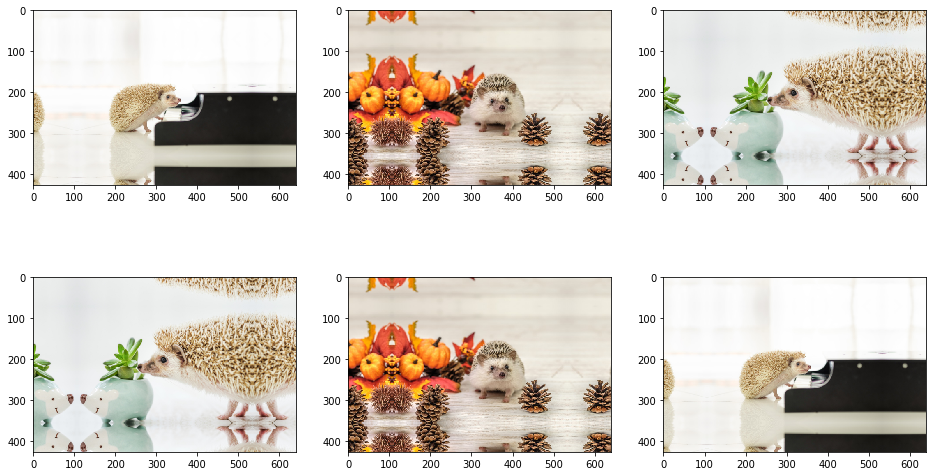

In [15]:
# フィルモード(デフォルトは'nearest')
# "nearest": aaaaaaaa|abcd|dddddddd
# "reflect": abcddcba|abcd|dcbaabcd
# "wrap": abcdabcd|abcd|abcdabcd
# "constant": kkkkkkkk|abcd|kkkkkkkk (cval=k)
image_generator = ImageDataGenerator(fill_mode='reflect', zoom_range=[1.5, 1.5])
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


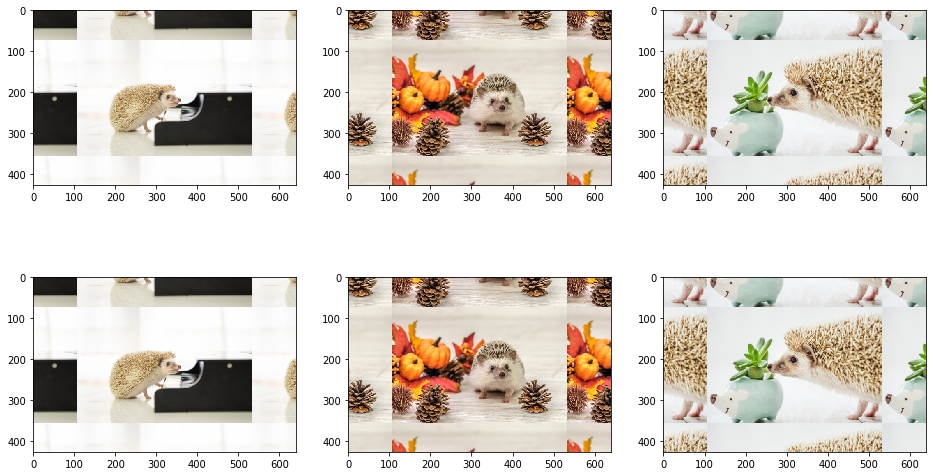

In [16]:
# フィルモード(デフォルトは'nearest')
# "nearest": aaaaaaaa|abcd|dddddddd
# "reflect": abcddcba|abcd|dcbaabcd
# "wrap": abcdabcd|abcd|abcdabcd
# "constant": kkkkkkkk|abcd|kkkkkkkk (cval=k)
image_generator = ImageDataGenerator(fill_mode='wrap', zoom_range=[1.5, 1.5])
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


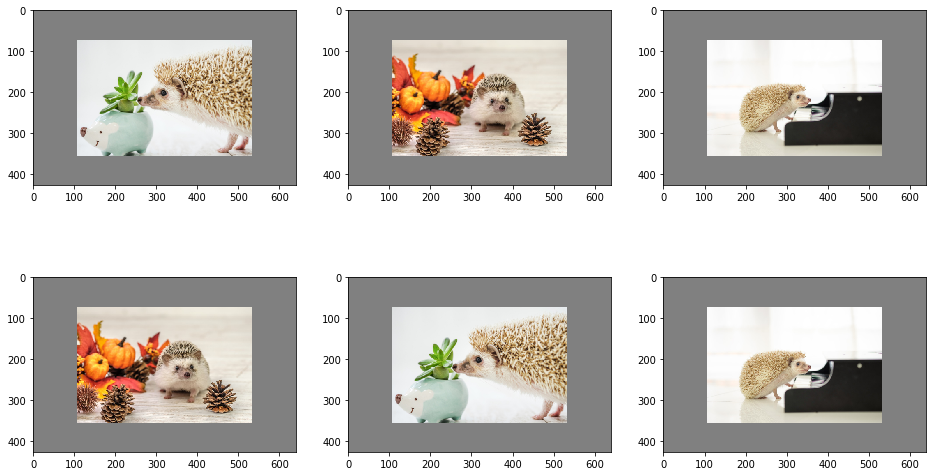

In [17]:
# フィルモード(デフォルトは'nearest')
# "nearest": aaaaaaaa|abcd|dddddddd
# "reflect": abcddcba|abcd|dcbaabcd
# "wrap": abcdabcd|abcd|abcdabcd
# "constant": kkkkkkkk|abcd|kkkkkkkk (cval=k)
image_generator = ImageDataGenerator(fill_mode='constant', cval=128, zoom_range=[1.5, 1.5])
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


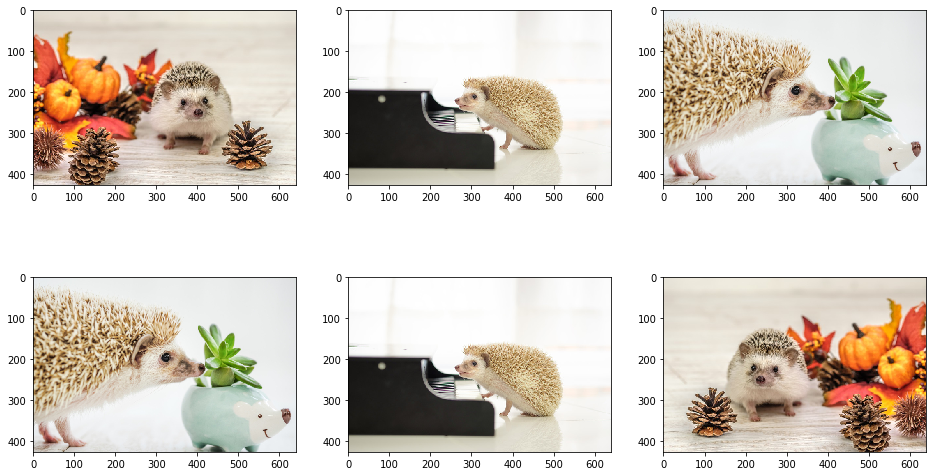

In [18]:
# ランダム水平反転
image_generator = ImageDataGenerator(horizontal_flip=True)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


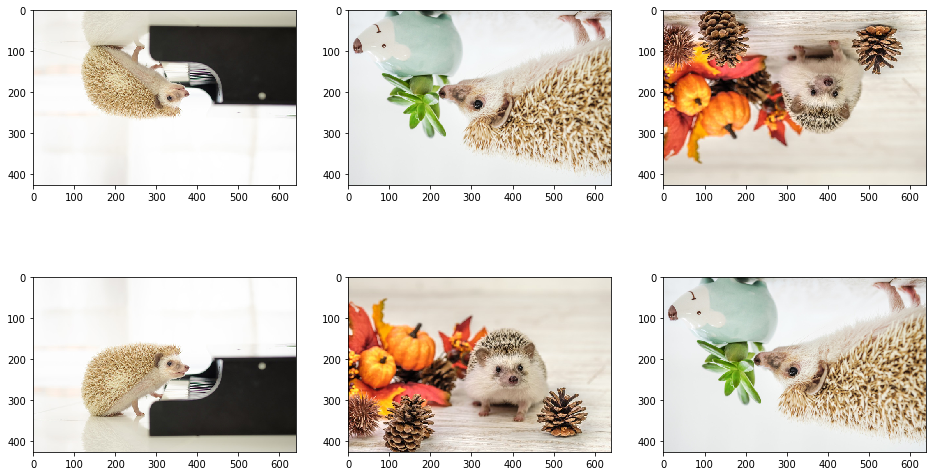

In [19]:
# ランダム垂直反転
image_generator = ImageDataGenerator(vertical_flip=True)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


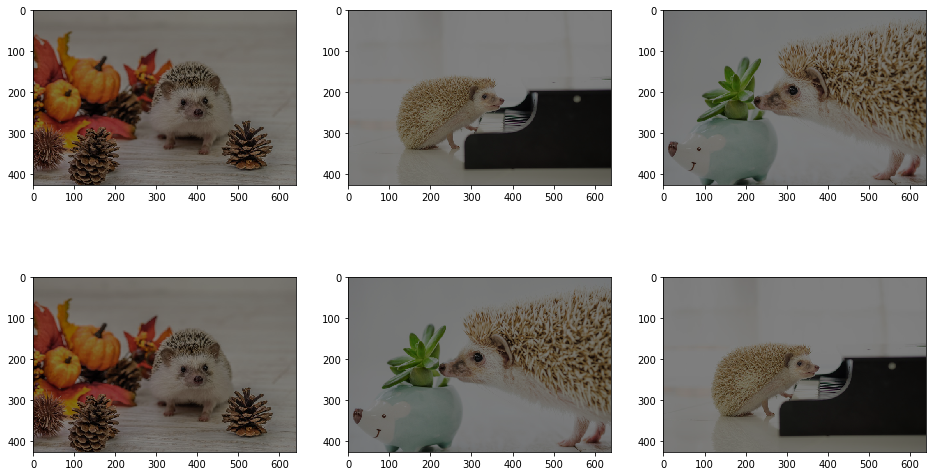

In [20]:
# リスケール(各画素を等倍)
image_generator = ImageDataGenerator(rescale=1.0/2)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


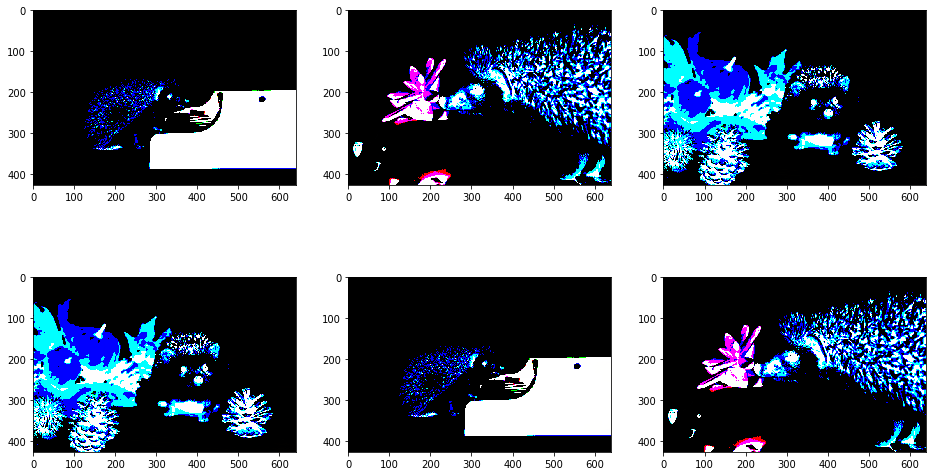

In [21]:
# 各サンプルの平均を0にする
image_generator = ImageDataGenerator(samplewise_center=True, samplewise_std_normalization=True)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


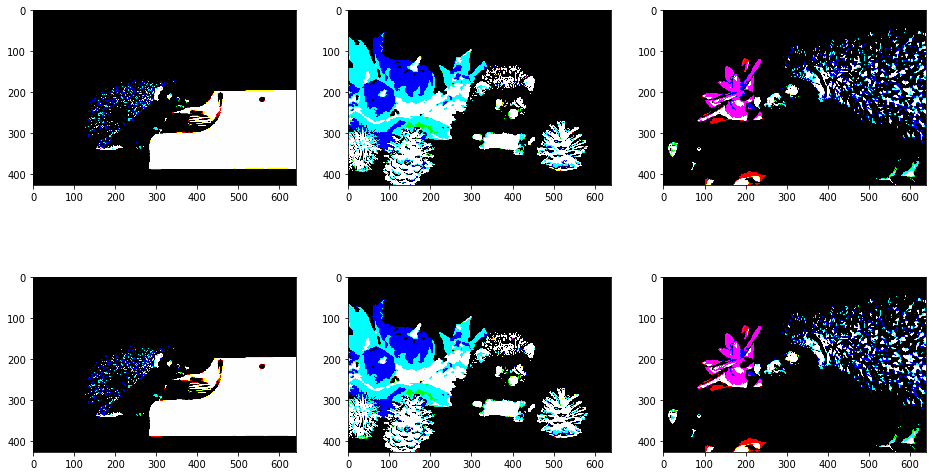

In [22]:
# データセット全体で入力の平均を0にする
image_generator = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
image_generator.fit(fit_dataset)
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

# Albumentationsを用いたデータ拡張(preprocessing_function経由)
参考：https://github.com/Kazuhito00/albumentations-examples

Albumentationsに実装されている手法のサンプルは参考URLを参照。

Found 3 images belonging to 1 classes.


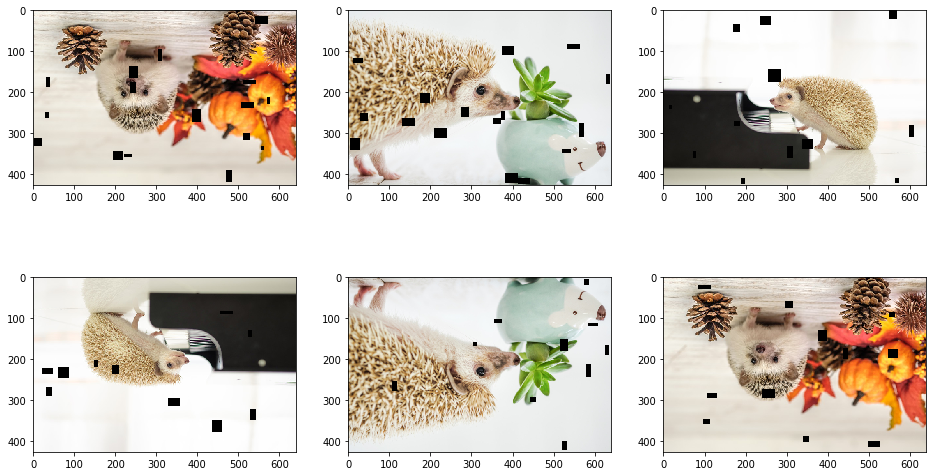

In [23]:
import albumentations as album

def preprocessing_augmentation_function():
    transform = [
        album.Flip(p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
        album.CoarseDropout(max_holes=16, max_height=32, max_width=32, min_holes=1, min_height=8, min_width=8, fill_value=0, p=1.0), # p(変換を適用する確率)は効果確認のため1.0指定
    ]
    augmentation_function = album.Compose(transform)

    def augmentation(x):
        augmentation_image = augmentation_function(image=x)
        return augmentation_image['image']

    return augmentation

# データ拡張実行
image_generator = ImageDataGenerator(preprocessing_function=preprocessing_augmentation_function())
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

# Cutout / Random Erasingを用いたデータ拡張
参考：https://github.com/yu4u/cutout-random-erasing.git

In [24]:
!git clone https://github.com/yu4u/cutout-random-erasing.git
sys.path.append(os.path.join(os.getcwd(), 'cutout-random-erasing'))

Cloning into 'cutout-random-erasing'...


Found 3 images belonging to 1 classes.


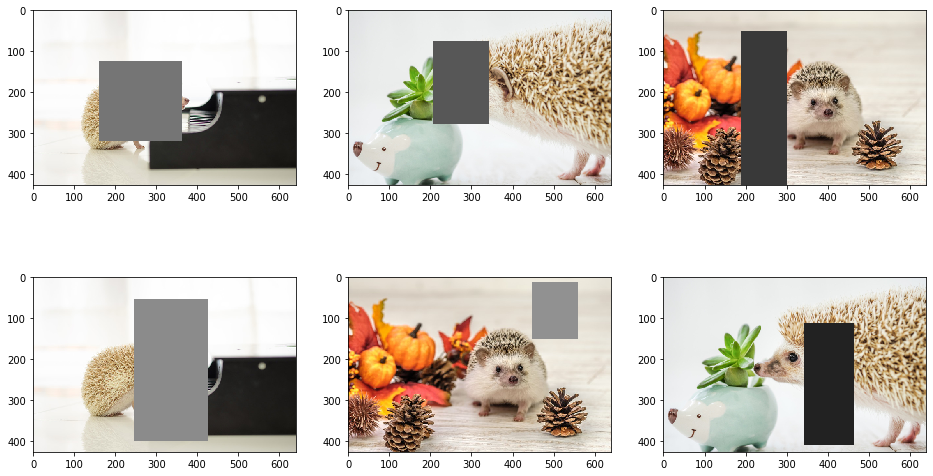

In [25]:
# Cutout
from random_eraser import get_random_eraser

# データ拡張実行
image_generator = ImageDataGenerator(preprocessing_function=get_random_eraser(p=1.0, pixel_level=False))
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

Found 3 images belonging to 1 classes.


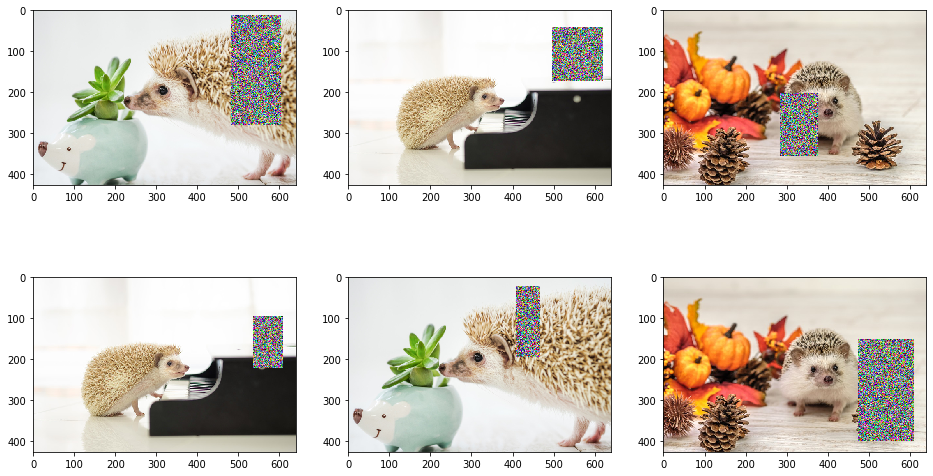

In [26]:
# Random Erasing
from random_eraser import get_random_eraser

# データ拡張実行
image_generator = ImageDataGenerator(preprocessing_function=get_random_eraser(p=1.0, pixel_level=True))
generator = image_generator.flow_from_directory(batch_size=batch_size, directory=image01_directory, target_size=image_size)

draw_generator_image(generator)

# Mixupを用いたデータ拡張
参考：https://github.com/Kazuhito00/mixup

In [27]:
!git clone https://github.com/Kazuhito00/mixup

sys.path.append(os.path.join(os.getcwd(), 'mixup'))
from mixup import mixup

Cloning into 'mixup'...


In [28]:
# データ拡張実行
image_generator = ImageDataGenerator()
generator = image_generator.flow_from_directory(batch_size=6, directory=image02_directory, target_size=image_size, class_mode='categorical')

batches = next(generator)
x_train= batches[0].astype(np.uint8)
y_train = batches[1].astype(np.uint8)

# MixUp実行
x, y = mixup(x_train, y_train, alpha=1.0)

Found 6 images belonging to 2 classes.


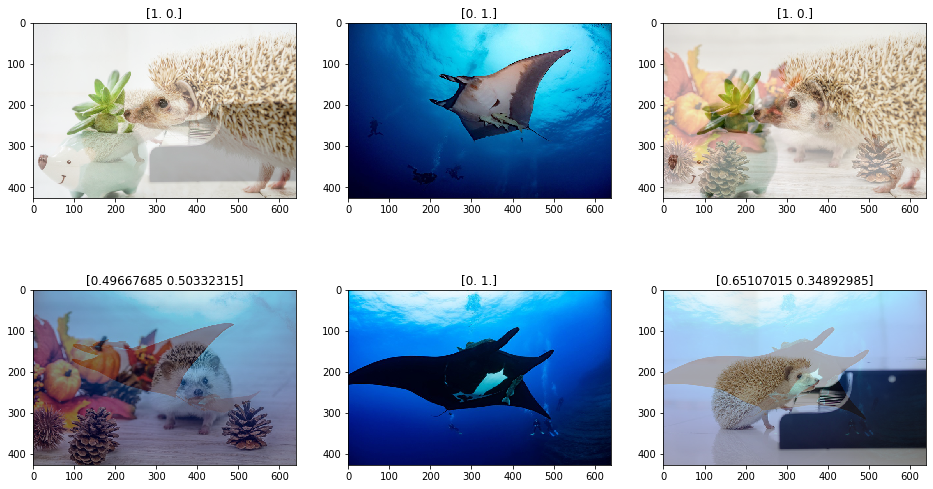

In [29]:
# 実行結果描画
x = np.array(x).astype(np.uint8)  # 描画用に符号なし整数化

plt.figure(figsize=(16, 9))

column = 3
row = 2
for i in range(column * row):
    plt.subplot(row, column, i+1)
    plt.title(str(y[i]))
    plt.imshow(x[i])
plt.show()

# CutMixを用いたデータ拡張
参考：https://github.com/Kazuhito00/mixup

In [30]:
!git clone https://github.com/Kazuhito00/cutmix

sys.path.append(os.path.join(os.getcwd(), 'cutmix'))
from cutmix import cutmix

Cloning into 'cutmix'...


In [31]:
# データ拡張実行
image_generator = ImageDataGenerator()
generator = image_generator.flow_from_directory(batch_size=6, directory=image02_directory, target_size=image_size, class_mode='categorical')

batches = next(generator)
x_train= batches[0].astype(np.uint8)
y_train = batches[1].astype(np.uint8)

# CutMix実行
x, y = cutmix(x_train, y_train, beta=1.0)

Found 6 images belonging to 2 classes.


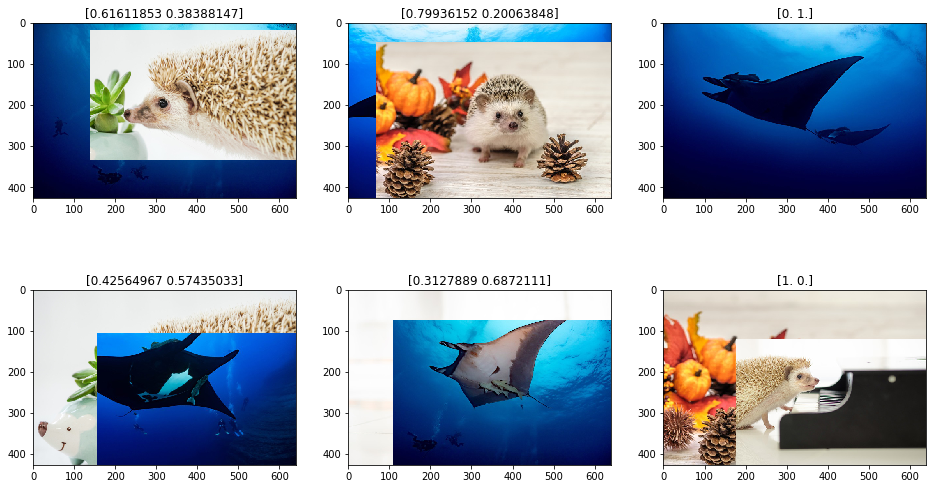

In [32]:
# 実行結果描画
x = np.array(x).astype(np.uint8)  # 描画用に符号なし整数化

plt.figure(figsize=(16, 9))

column = 3
row = 2
for i in range(column * row):
    plt.subplot(row, column, i+1)
    plt.title(str(y[i]))
    plt.imshow(x[i])
plt.show()

# RICAPを用いたデータ拡張
参考：https://github.com/koshian2/keras-ricap

In [33]:
!git clone https://github.com/koshian2/keras-ricap

sys.path.append(os.path.join(os.getcwd(), 'keras-ricap'))
from ricap import ricap

Cloning into 'keras-ricap'...


In [34]:
# データ拡張実行
image_generator = ImageDataGenerator()
generator = image_generator.flow_from_directory(batch_size=12, directory=image03_directory, target_size=image_size, class_mode='categorical')

batches = next(generator)
x_train= batches[0].astype(np.uint8)
y_train = batches[1].astype(np.uint8)

# RICAP実行
x, y = ricap(x_train, y_train, beta=0.5, use_same_random_value_on_batch=False)

Found 12 images belonging to 4 classes.


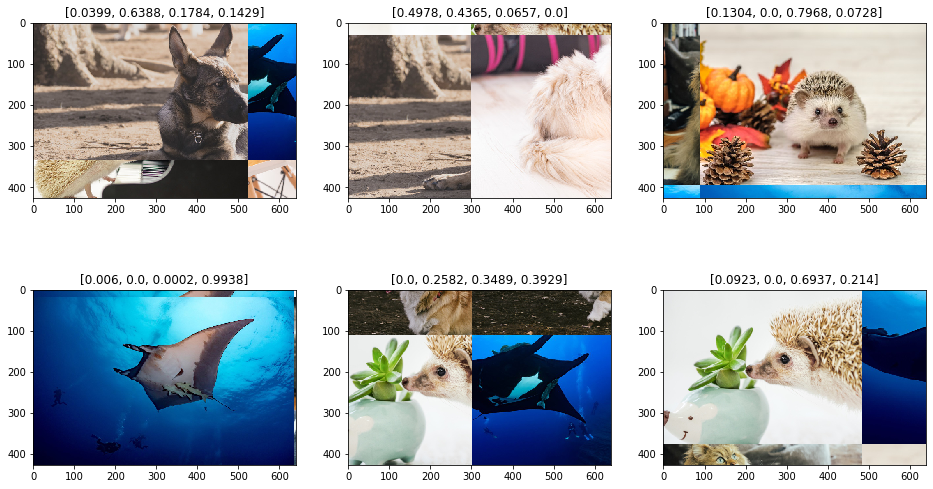

In [35]:
# 実行結果描画
x = np.array(x).astype(np.uint8)  # 描画用に符号なし整数化
y = np.round(y, 4).tolist()  # タイトル表示用に表示桁数を減らす

plt.figure(figsize=(16, 9))

column = 3
row = 2
for i in range(column * row):
    plt.subplot(row, column, i+1)
    plt.title(str(y[i]))
    plt.imshow(x[i])
plt.show()

# TODO：ChangeBackground